## Imports

In [1]:
import pandas as pd
import numpy as np

from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import LabelEncoder
import re

from sklearn.svm import LinearSVC,SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_selection import RFECV
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
# from tensorflow import keras
# from keras.wrappers.scikit_learn import KerasClassifier
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import Dropout
# import tensorflow
# tensorflow.random.set_seed(36)


from sklearn.metrics import roc_auc_score, f1_score, accuracy_score

from IPython.display import display, Markdown

## Visualisations of base data

In [2]:
df=pd.read_csv('10k_diabetes/diab_train.csv')
df=df.drop(columns=['diag_1_desc','diag_2_desc','diag_3_desc','payer_code','weight','medical_specialty'])
profile = ProfileReport(df) #do your own analysis
profile

C:\ProgramData\Anaconda3\envs\tensorflow\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,46
Number of observations,6000
Total Missing (%),0.5%
Total size in memory,2.1 MiB
Average record size in memory,368.0 B
Numeric,9
Categorical,28
Boolean,1
Date,0
Text (Unique),0
Rejected,8


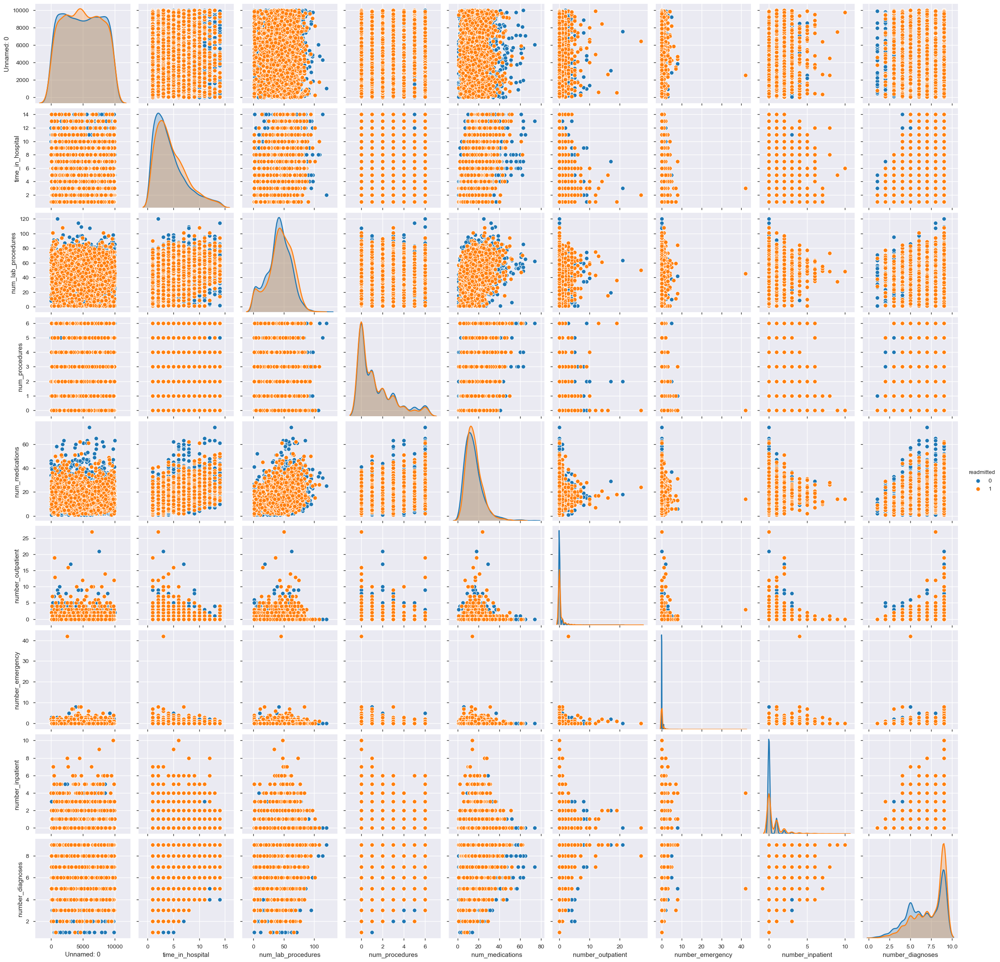

In [3]:
sns.pairplot(df, hue='readmitted')
plt.show()

## Preprocessing 
### Preprocessing parameters/constants

In [4]:
admission_source_dict=dict()
admission_source_dict['Physician Referral']=1
admission_source_dict['Clinic Referral']=1
admission_source_dict['HMO Referral']=1
admission_source_dict['Transfer from a Skilled Nursing Facility (SNF)']=2
admission_source_dict['Transfer from another health care facility']=2
admission_source_dict['Transfer from a hospital']=2
admission_source_dict['Emergency Room']=3

admission_type_dict=dict()
admission_type_dict['Elective']=0
admission_type_dict['Urgent']=1
admission_type_dict['Newborn']=1
admission_type_dict['Emergency']=2

discharge_terms=[("Hospice",5),("home",0),("outpatient",1),("SNF",1),("ICF",1),("Left AMA",2),("swing bed",2),("short term",2),("long term",3),("inpatient",3)]

diag_chapters=[140,240,280,290,320,390,460,520,580,630,680,710,740,760,780,800,999]#else get in last

identity_columns=['Unnamed: 0','diag_1','diag_2', 'diag_3','admission_type_id','discharge_disposition_id', 'admission_source_id']
integer_columns=['age','time_in_hospital','number_diagnoses','num_lab_procedures', 'num_procedures', 'num_medications','number_outpatient', 'number_emergency', 'number_inpatient', ]
encoder_columns=['race', 'gender','max_glu_serum', 'A1Cresult','metformin', 'glimepiride', 'glipizide', 'glyburide', 'pioglitazone','rosiglitazone', 'insulin', 'change', 'diabetesMed']

### Preprocessing helper functions

In [17]:
def create_dicts(diag_chapters):
    chapter_dict=np.array([0]*(len(diag_chapters)+1))
    return chapter_dict

def update_dicts(row,diag_chapters,diag_chapter):
    for item in row:
        if item is not np.nan:
            for i in range(len(diag_chapters)):
                if item<str(diag_chapters[i]):
                    diag_chapter[i]+=1
                    return diag_chapter
            diag_chapter[len(diag_chapters)]+=1
    return diag_chapter

def search(item, terms):
    if item is not np.nan:
        for term in terms:
            if term[0] in item:
                return term[1]
    return np.nan

def lookup(item,dikt):
    if item in dikt.keys():
        return dikt[item]
    else:
        return np.nan

def format_age(item):
    if item is not np.nan:
        return int(re.split('-',item[1:])[0])
    else:
        return np.nan
    
def format_diag(item):
    if item is not np.nan:
        if item[0] =='V':
            return int('1'+item[1:])
        elif item[0] =='E':
            return int('2'+item[1:])
        elif item[0]=='?':
            return np.nan
        else:
            return int(re.split('\.',item)[0])
    else:
         return item
        
def discard(item):
    if item is "Not Mapped" or item is "Not Available":
        return np.nan
    return item

def preprocess(df,column_parameters):
    #straight forward pre-processing, explained in the adjacent markdown document.
    y=df['readmitted']
    df=df.drop(columns=['diag_1_desc','diag_2_desc','diag_3_desc','payer_code','weight','medical_specialty','readmitted'])
    df=df.drop(columns=['chlorpropamide','nateglinide','repaglinide','acetohexamide','tolbutamide','glyburide.metformin','glipizide.metformin','glimepiride.pioglitazone', 'metformin.rosiglitazone','metformin.pioglitazone','acarbose', 'miglitol', 'troglitazone','tolazamide', 'examide', 'citoglipton'])
    df['age']=df['age'].apply(lambda x: format_age(x))
    df['admission_type_id']=df['admission_type_id'].apply(lambda item: lookup(item,admission_type_dict))
    df['admission_source_id']=df['admission_source_id'].apply(lambda item: lookup(item,admission_source_dict))
    df['discharge_disposition_id']=df['discharge_disposition_id'].apply(lambda item: search(item,discharge_terms))
    
    #make new features, based on the chapters of the different diagnoses
    df['dicts']=np.nan
    df['dicts']=df['dicts'].astype(object)
    rows=df.shape[0]
    for i in range(rows):
        df.at[i,'dicts']=create_dicts(diag_chapters)
    
    df['dicts']=df.apply(lambda row: update_dicts([row['diag_1'],row['diag_2'],row['diag_3']],diag_chapters,row['dicts']),axis=1)
    
    #make columns out of the different entries in the dicts, one entry for each chapter.
    for chapter in range(len(diag_chapters)+1):
        df['chapter'+str(chapter)]=df['dicts'].apply(lambda x: x[chapter])
    df=df.drop(columns=['dicts'])
    
    #finally clean diag
    df['diag_1']=df['diag_1'].apply(lambda item: format_diag(item))
    df['diag_2']=df['diag_2'].apply(lambda item: format_diag(item))
    df['diag_3']=df['diag_3'].apply(lambda item: format_diag(item))
    
    #stage 1 ended, the second stage starts now.
    if column_parameters is None:
        column_parameters=[dict(), dict()]
        #column_parameters=[fill_value, encoder]
        
    for column in encoder_columns:
        df[column]=df[column].apply(discard)
        if column not in column_parameters[0]:
            encoder= LabelEncoder()
            encoder=encoder.fit(df[column])
            #we have to transform before taking the most seen value
            df[column]=encoder.transform(df[column])
            #fillvalue[column]= most seen value
            column_parameters[0][column]=df[column].mode()[0]
            column_parameters[1][column]=encoder
        else:
            df[column]=column_parameters[1][column].transform(df[column])
        df[column]=df[column].fillna(column_parameters[0][column])
    
    for column in identity_columns:
        if column not in column_parameters[0]:
            #fillvalue[column]= most seen value
            column_parameters[0][column]=df[column].mode()[0]
        df[column]=df[column].fillna(column_parameters[0][column])
        
    for column in integer_columns:
        if column not in column_parameters[0]:
            column_parameters[0][column]=df[column].mean()
        df[column]=df[column].fillna(column_parameters[0][column])
    return df,y,column_parameters

## Visualisations after pre-processing

In [18]:
df=pd.read_csv('10k_diabetes/diab_train.csv')
df,y,column_parameters=preprocess(df,None)
profile = ProfileReport(pd.concat([df, y], axis=1))
profile

C:\ProgramData\Anaconda3\envs\tensorflow\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,48
Number of observations,6000
Total Missing (%),0.0%
Total size in memory,1.9 MiB
Average record size in memory,332.0 B
Numeric,28
Categorical,0
Boolean,19
Date,0
Text (Unique),0
Rejected,1


In [19]:
sns.pairplot(pd.concat([df, y], axis=1), hue='readmitted')
plt.show() #you may want to download this image and look at it in an image viewer, if you are interested.

C:\ProgramData\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
C:\ProgramData\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\distributions.py:288: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


## Machine Learning
### Learning helper functions

In [21]:
train=pd.read_csv('10k_diabetes/diab_train.csv')
train_x,train_y,column_parameters=preprocess(train,None)
test=pd.read_csv('10k_diabetes/diab_test.csv')
test_x,test_y,column_parameters=preprocess(test,column_parameters)

def train_test(estimator,parameters,n_jobs):
    grid = GridSearchCV(estimator, parameters,n_jobs=n_jobs)
    grid.fit(train_x, train_y)
    best_estimator=grid.best_estimator_
    
    feature_elem=RFECV(estimator=best_estimator, step=1, scoring='accuracy',)
    feature_elem.fit(train_x,train_y)
    
    elem_train=feature_elem.transform(train_x)
    elem_test=feature_elem.transform(test_x)
    
    fitted_estimator=best_estimator.fit(elem_train,train_y)
    predictions=fitted_estimator.predict(elem_test)
    
    print('Accuracy:')
    acc=accuracy_score(test_y,predictions)
    print(acc)
    print('AUROC:')
    roc=roc_auc_score(test_y,predictions)
    print(roc)
    print('F1:')
    f1=f1_score(test_y,predictions)
    print(f1)
    
    return acc, roc, f1

def build_keras(df,dropout,neurons,layers,activation):
    # create model
    model = Sequential()
    model.add(Dense(neurons, input_dim=df.shape[1], activation=activation))
    model.add(Dropout(dropout))
    for i in range(layers):
        model.add(Dense(neurons, activation=activation))
        model.add(Dropout(dropout))
    model.add(Dense(1, activation='sigmoid'))
    # Compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

### Learning executions

In [ ]:
gradient_estimator = GradientBoostingClassifier(random_state=36)
gradient_parameters = {'max_depth':[1,3,6,12], 'n_estimators':[1, 10,100,1000], 'max_features':['auto','log2',None]}
gradient_acc,gradient_roc,gradient_f1=train_test(gradient_estimator,gradient_parameters,4)

tree_estimator=DecisionTreeClassifier(random_state=36)
tree_parameters = {'class_weight':[None,'balanced'], 'max_depth':[1,3,6,12], 'max_features':['auto','log2',None]}
tree_acc,tree_roc,tree_f1=train_test(tree_estimator,tree_parameters,4)

svc_estimator=SVC(random_state=36)
svc_parameters = {'class_weight':[None,'balanced'], 'C':[0.1,1, 10],'kernel':['sigmoid','rbf','poly'],'gamma':['auto','scale'],'degree':[1,3,6,12]}
svc_acc,svc_roc,svc_f1=train_test(svc_estimator,svc_parameters,4)

linear_estimator = LinearSVC(random_state=36)
linear_parameters = {'class_weight':[None,'balanced'], 'C':[0.1,1, 10]}
linear_acc,linear_roc,linear_f1=train_test(linear_estimator,linear_parameters,4)

neighbor_estimator=KNeighborsClassifier()
neighbor_parameters = {'n_neighbors':[1,3,6,12],'weights': ['uniform','distance']}
neighbor_acc,neighbor_roc,neighbor_f1=train_test(neighbor_estimator,neighbor_parameters,4)

nn_estimator = KerasClassifier(build_fn=build_keras, epochs=100, batch_size=10, verbose=0)
dataframe=[df]
dropout=[0.0,0.1,0.25,0.33,0.5]
neurons = [1, 5, 10, 20, 30, 50]
layers=[0,1,2,3]
activation=['softmax','selu','relu','tanh','sigmoid']
nn_parameters = dict(df=dataframe,dropout=dropout,neurons=neurons,layers=layers,activation=activation)
nn_acc,nn_roc,nn_f1=train_test(nn_estimator,nn_parameters,1)

Accuracy:
0.639
AUROC:
0.5795856662114964
F1:
0.39123102866779086
Accuracy:
0.6195
AUROC:
0.5612672399652718
F1:
0.3684647302904564


In [ ]:
# df=pd.read_csv('10k_diabetes/diab_train.csv')
# df,y,column_parameters=preprocess(df,None)

# parameters = {'class_weight':[None,'balanced'], 'max_depth':[1,3,6,12], 'max_features':['auto','log2',None]}
# svc=DecisionTreeClassifier(random_state=36)
# clf = GridSearchCV(svc, parameters,n_jobs=4)
# clf.fit(df, y)

# svc=clf.best_estimator_
# rfe=RFECV(estimator=svc, step=1, scoring='accuracy',)
# rfe.fit(df,y)
# df=rfe.transform(df)
# svc=svc.fit(df,y)
# df=pd.read_csv('10k_diabetes/diab_validation.csv')
# df,y,column_parameters=preprocess(df,column_parameters)
# df=rfe.transform(df)

# predictions=svc.predict(df)
# print('Accuracy:')
# print(accuracy_score(y,predictions))
# print('AUROC:')
# print(roc_auc_score(y,predictions))
# print('F1:')
# print(f1_score(y,predictions))

In [ ]:
# df=pd.read_csv('10k_diabetes/diab_train.csv')
# df,y,column_parameters=preprocess(df,None)

# parameters = {'class_weight':[None,'balanced'], 'C':[0.1,1, 10],'kernel':['sigmoid','rbf','poly'],'gamma':['auto','scale'],'degree':[1,3,6,12]}
# svc=SVC(random_state=36)
# clf = GridSearchCV(svc, parameters,n_jobs=4)
# clf.fit(df, y)

# svc=clf.best_estimator_
# rfe=RFECV(estimator=svc, step=1, scoring='accuracy',)
# rfe.fit(df,y)
# df=rfe.transform(df)
# svc=svc.fit(df,y)
# df=pd.read_csv('10k_diabetes/diab_validation.csv')
# df,y,column_parameters=preprocess(df,column_parameters)
# df=rfe.transform(df)

# predictions=svc.predict(df)
# print('Accuracy:')
# print(accuracy_score(y,predictions))
# print('AUROC:')
# print(roc_auc_score(y,predictions))
# print('F1:')
# print(f1_score(y,predictions))

In [ ]:
# df=pd.read_csv('10k_diabetes/diab_train.csv')
# df,y,column_parameters=preprocess(df,None)

# parameters = {'class_weight':[None,'balanced'], 'C':[0.1,1, 10]}
# svc = LinearSVC(random_state=36)
# clf = GridSearchCV(svc, parameters,n_jobs=4)
# clf.fit(df, y)

# svc=clf.best_estimator_
# rfe=RFECV(estimator=svc, step=1, scoring='accuracy',)
# rfe.fit(df,y)
# df=rfe.transform(df)
# svc=svc.fit(df,y)
# df=pd.read_csv('10k_diabetes/diab_validation.csv')
# df,y,column_parameters=preprocess(df,column_parameters)
# df=rfe.transform(df)

# predictions=svc.predict(df)
# print('Accuracy:')
# print(accuracy_score(y,predictions))
# print('AUROC:')
# print(roc_auc_score(y,predictions))
# print('F1:')
# print(f1_score(y,predictions))

In [ ]:
# df=pd.read_csv('10k_diabetes/diab_train.csv')
# df,y,column_parameters=preprocess(df,None)

# parameters = {'class_weight':[None,'balanced'], 'C':[0.1,1, 10]}
# svc = LinearSVC(random_state=36)
# clf = GridSearchCV(svc, parameters,n_jobs=4)
# clf.fit(df, y)

# svc=clf.best_estimator_
# rfe=RFECV(estimator=svc, step=1, scoring='accuracy',)
# rfe.fit(df,y)
# df=rfe.transform(df)
# svc=svc.fit(df,y)
# df=pd.read_csv('10k_diabetes/diab_validation.csv')
# df,y,column_parameters=preprocess(df,column_parameters)
# df=rfe.transform(df)

# predictions=svc.predict(df)
# print('Accuracy:')
# print(accuracy_score(y,predictions))
# print('AUROC:')
# print(roc_auc_score(y,predictions))
# print('F1:')
# print(f1_score(y,predictions))

In [ ]:
# df=pd.read_csv('10k_diabetes/diab_train.csv')
# df,y,column_parameters=preprocess(df,None)

# parameters = {'n_neighbors':[1,3,6,12],'weights': ['uniform','distance']}
# svc=KNeighborsClassifier()
# clf = GridSearchCV(svc, parameters,n_jobs=4)
# clf.fit(df, y)

# svc=clf.best_estimator_
# rfe=RFECV(estimator=svc, step=1, scoring='accuracy',)
# rfe.fit(df,y)
# df=rfe.transform(df)
# svc=svc.fit(df,y)
# df=pd.read_csv('10k_diabetes/diab_validation.csv')
# df,y,column_parameters=preprocess(df,column_parameters)
# df=rfe.transform(df)

# predictions=svc.predict(df)
# print('Accuracy:')
# print(accuracy_score(y,predictions))
# print('AUROC:')
# print(roc_auc_score(y,predictions))
# print('F1:')
# print(f1_score(y,predictions))

In [ ]:
# from tensorflow import keras
# from keras.wrappers.scikit_learn import KerasClassifier
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import Dropout
# import tensorflow
# tensorflow.random.set_seed(36)

# df=pd.read_csv('10k_diabetes/diab_train.csv')
# df,y,column_parameters=preprocess(df,None)
# def build_keras(df,dropout,neurons,layers,activation):
#     # create model
#     model = Sequential()
#     model.add(Dense(neurons, input_dim=df.shape[1], activation=activation))
#     model.add(Dropout(dropout))
#     for i in range(layers):
#         model.add(Dense(neurons, activation=activation))
#         model.add(Dropout(dropout))
#     model.add(Dense(1, activation='sigmoid'))
#     # Compile model
#     model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#     return model
# model = KerasClassifier(build_fn=build_keras, epochs=100, batch_size=10, verbose=0)
# # define the grid search parameters
# dataframe=[df]
# dropout=[0.0,0.1,0.25,0.33,0.5]
# neurons = [1, 5, 10, 20, 30, 50]
# layers=[0,1,2,3]
# activation=['softmax','selu','relu','tanh','sigmoid']

# param_grid = dict(df=dataframe,dropout=dropout,neurons=neurons,layers=layers,activation=activation)
# grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=1, cv=5)
# grid_result = grid.fit(df, y)

## Results

In [ ]:
display(Markdown("""
| Model       | F1-score      |AUROC  |Accuracy|
| ---------------|--------------:| -----:| ------:|
|GradientBoosting | """+str(gradient_f1)+""" | """+str(gradient_auroc)+""" | """+str(gradient_acc)+"""|
|DecisionTree      | """+str(tree_f1)+""" | """+str(tree_auroc)+""" | """+str(tree_acc)+"""|
|SVC | """+str(svc_f1)+""" | """+str(svc_auroc)+""" | """+str(svc_acc)+"""|
|Linear | """+str(linear_f1)+""" | """+str(linear_auroc)+""" | """+str(linear_acc)+"""|
|Nearest Neighbor | """+str(neighbor_f1)+""" | """+str(neighbor_auroc)+""" | """+str(neighbor_acc)+"""|
|Neural Net | """+str(nn_f1)+""" | """+str(nn_auroc)+""" | """+str(nn_acc)+"""|
"""))